# Last Away

I can write things about what the code does!

In [1]:
import sys
sys.path.append('/home/monica/pacman/across_subject_analyses/scripts')
from average_tfr_functions import *
import matplotlib.pyplot as plt
# matplotlib.use("Qt5Agg")
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import signal, stats
import mat73
import re
import os
import mne
import IPython
import seaborn as sns
import scipy
import joblib
import pickle

import statsmodels
from statsmodels import stats
from statsmodels.stats import multitest

# Import required code for visualizing example models
from fooof import FOOOF
from fooof.sim.gen import gen_power_spectrum
from fooof.sim.utils import set_random_seed
from fooof.plts.spectra import plot_spectra
from fooof.plts.annotate import plot_annotated_model
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series
from neurodsp.spectral import compute_spectrum, rotate_powerlaw
from neurodsp.plts.spectral import plot_power_spectra

## import custom functions
import sys
sys.path.append('/home/monica/pacman/preprocessing/scripts')
from preproc_functions import *
import average_tfr_functions



In [2]:
# folders
raw_dir = '/home/monica/pacman/raw_data'
preproc_dir = '/home/monica/pacman/preprocessing'
tfr_dir = '/mnt/knight_server/remote/bstavel/pacman/preprocessing'

# subjects
sub_list = ['BJH021', 'BJH025', 'BJH016', 'SLCH002', 'BJH026', 'BJH027', 'BJH029', 'BJH039', 'BJH041', 'LL10', 'LL12', 'LL13', 'LL14', 'LL17', 'LL19']
mfg_sub_list = ['BJH021', 'BJH025','BJH016', 'SLCH002', 'BJH026', 'BJH027', 'BJH039', 'LL12', 'LL13','LL14', 'LL17', 'LL19']
#'LL10', ,  ]
sfg_sub_list = ['BJH025', 'LL12', 'LL13', 'LL14']
sgACC_sub_list = ['BJH025', 'BJH016' , 'SLCH002', 'BJH026', 'BJH039', 'LL17' , 'LL19' ]
#'LL10' ,
dACC_sub_list = ['BJH021', 'BJH016', 'BJH039', 'LL12', 'LL13' ]
#, 'LL10'
Lamyg_sub_list = ['BJH021', 'BJH025', 'BJH016', 'BJH026', 'BJH027', 'BJH029', 'BJH039', 'BJH041', 'LL12', 'LL13', 'LL14', 'LL17', 'LL19']
#, 'LL10'
Ramyg_sub_list = ['BJH021', 'BJH025', 'BJH016', 'BJH026', 'BJH027', 'BJH029', 'BJH039', 'BJH041', 'LL12', 'LL13', 'LL14', 'LL17', 'LL19']
#, 'LL10'
Lhc_sub_list = ['BJH021', 'BJH025', 'BJH016', 'BJH026', 'BJH027', 'BJH029', 'BJH041', 'LL12', 'LL13', 'LL14', 'LL17']
#, 'LL10'
Rhc_sub_list = ['BJH025', 'BJH016', 'SLCH002', 'BJH027', 'BJH029', 'BJH039', 'LL12', 'LL13', 'LL14', 'LL17', 'LL19']
#, 'LL10'
# conditions
conditions = ['TrialType <= 16', 'TrialType > 16']

In [3]:
%run ../../preprocessing/scripts/roi.py

In [4]:
def calculate_last_away_average(sub_list, string_filters, roi, subregion_name):
    """
    Calculates the average TFRs for the LAST AWAY condition across subjects,
    handling potential differences in sampling rates and saving progress for
    efficiency.

    Args:
        sub_list (list): A list of subject IDs to process.
        string_filters (list): A list of strings to filter TFR cases by.
        roi (str): The name of the region of interest.

    Returns:
        list: A list of lists containing average TFRs for each string filter.

    Steps:
        1. Iterates through subjects:
            - Checks for TFR file existence.
            - Loads and preprocesses TFR data (log and zscore).
            - Filters TFR cases based on string_filters.
            - Calculates mean TFRs for each case and appends to a list.
            - Handles exceptions and reports any errors.
        2. Saves intermediate progress to a pickle file.
        3. Invert list structure for easier processing.
        4. Calculates average TFRs for each string filter:
            - Identifies subjects with high or low sampling rates.
            - Calculates separate means for high and low rate TFRs.
            - Combines and averages TFRs from different sampling rates if applicable.
        5. Returns a list of average TFRs for each string filter.
    """
    tfrs = []
    used_subs = []
    for subject in sub_list:

        #try:
        if os.path.exists(f"{tfr_dir}/{subject}/ieeg/last_away/{roi}-tfr.h5"):
            # load data
            used_subs.append(subject)
                
            # load data
            tmp_TFR = mne.time_frequency.read_tfrs(f"{tfr_dir}/{subject}/ieeg/last_away/{roi}-tfr.h5")

            # zscore and log
            tmp_TFR = log_and_zscore_TFR(tmp_TFR, baseline = (-2,2), logflag=True)
                    
            sub_ROIs = ROIs.copy()[subject]
                    
            subroi_list, subroi_names, subroi_indices = get_roi_elec_lists(sub_ROIs, tmp_TFR, subregion_name)
                    
            # create a new tfr with only the mfg channels
            subroi_tfr = tmp_TFR.copy().pick_channels(subroi_list)

            tfr_cases = []
            for case in string_filters:            
                # filter
                tfr_case = subroi_tfr[case]
                # append
                tfr_cases.append(tfr_case.data.mean(axis = 0).mean(axis = 0))

            # get mean and append
            tfrs.append(tfr_cases)

        #except Exception as e:
        #    print(f"Failed to load {subject}")
        #    print(e)
        #    used_subs.remove(subject)
        #    continue

        print(f"currently used subs: {used_subs}")

    # save progress cuz it is so long to load these dang things       
    with open(f'../ieeg/last_away_average_{roi}.pkl', 'wb') as f:
        pickle.dump(tfrs, f)                
        
    # invert list so the outer list is the string filter
    tfrs_cases = [[tfrs[j][i] for j in range(len(tfrs))] for i in range(len(tfrs[0]))]

    all_subs_averages = []
    for tfr_case in tfrs_cases:

        if any("LL" in subject for subject in sub_list):

            # get indicies of high/low samp rate subs
            first_ll_sub = [subject for subject in used_subs if "LL" in subject][0]
            ll_begin = used_subs.index(first_ll_sub)

            # high sampling rate
            washu_tfrs = np.asarray(tfr_case[0:ll_begin])
            washu_tfrs_mean = washu_tfrs.mean(axis = 0)

            # Low sampling rate
            ll_tfrs = np.asarray(tfr_case[ll_begin:])
            ll_tfrs_mean = ll_tfrs.mean(axis = 0)

            # combine
            all_subs_tfrs = np.stack((washu_tfrs_mean[:, ::2], ll_tfrs_mean[:, 0:2001]))

            # mean
            all_subs_average = all_subs_tfrs.mean(axis = 0)
            all_subs_averages.append(all_subs_average)
            
        else:
            
            # high sampling rate
            washu_tfrs = np.asarray(tfr_case)
            washu_tfrs_mean = washu_tfrs.mean(axis = 0)

            # mean
            all_subs_average = washu_tfrs_mean
            all_subs_averages.append(all_subs_average)    

    return all_subs_averages


In [5]:
def get_roi_elec_lists(ROIs, epochs, roi):

    # prep lists
    roi_list = []
    roi_names = []
    roi_indices = []

    # exclude bad ROI from list
    pairs_long_name = [ch.split('-') for ch in epochs.info['ch_names']]
    bidx = len(epochs.info['bads']) +1
    pairs_name = pairs_long_name[bidx:len(pairs_long_name)]

    # sort ROI into lists
    for ix in range(0, len(pairs_name)):
        if pairs_name[ix][0] in ROIs[roi] or pairs_name[ix][1] in ROIs[roi]:
            roi_list.append(epochs.info['ch_names'][ix + bidx])
            roi_names.append(pairs_name[ix])
            roi_indices.append(ix)

    return roi_list, roi_names, roi_indices

## Hippocampus

In [ ]:
all_subs_average_dlpfcs = calculate_last_away_average(mfg_sub_list, conditions, 'dlpfc', 'mfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]

In [7]:
all_subs_average_hcs = calculate_last_away_average(sub_list, conditions, 'hc', 'hc')
all_subs_average_hc_conflict = all_subs_average_hcs[0]
all_subs_average_hc_noconflict = all_subs_average_hcs[1]


currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []
currently used subs: []


IndexError: list index out of range

In [ ]:
plot_allsub_averages(all_subs_average_hc_conflict, "Average Hippocampal Time–frequency Representation in Conflict Trials", 'average_hc_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_hc_noconflict, "Average Hippocampal Time–frequency Representation in No-Conflict Trials", 'average_hc_noconflict_all_subs.png', -2, 2)

### Left Hippocampus

In [6]:
all_subs_average_hcs = calculate_last_away_average(Lhc_sub_list, conditions, 'hc' , 'Lhc')
all_subs_average_hc_conflict = all_subs_average_hcs[0]
all_subs_average_hc_noconflict = all_subs_average_hcs[1]


Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/hc-tfr.h5 ...


findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

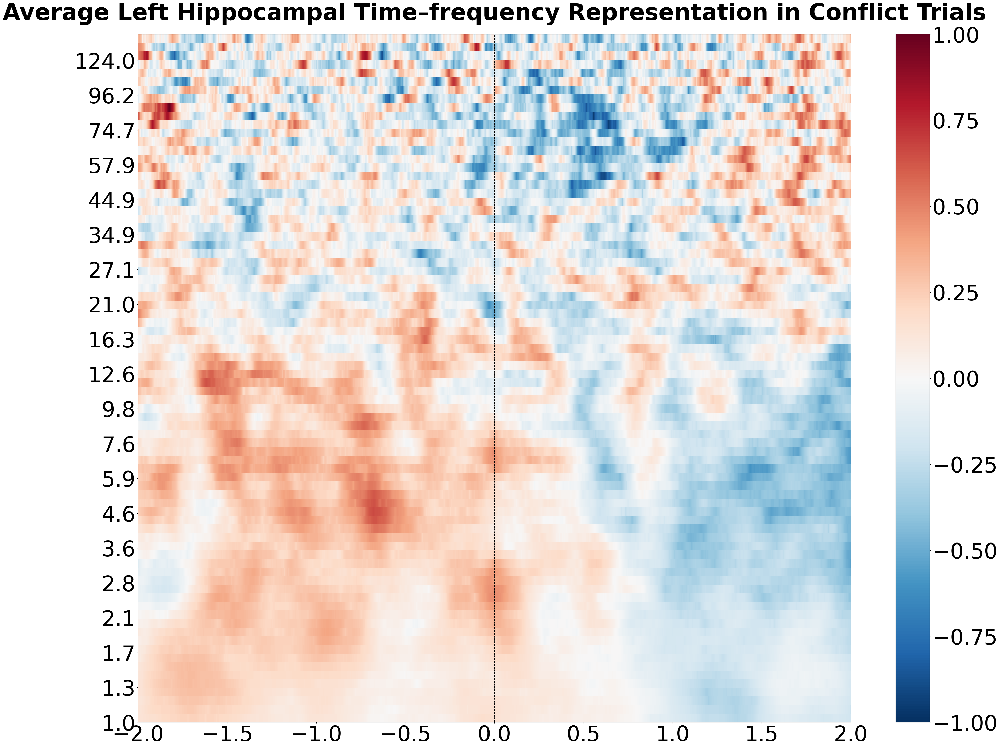

In [7]:
plot_allsub_averages(all_subs_average_hc_conflict, "Average Left Hippocampal Time–frequency Representation in Conflict Trials", 'average_Lhc_conflict_all_subs.png', -2, 2)

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

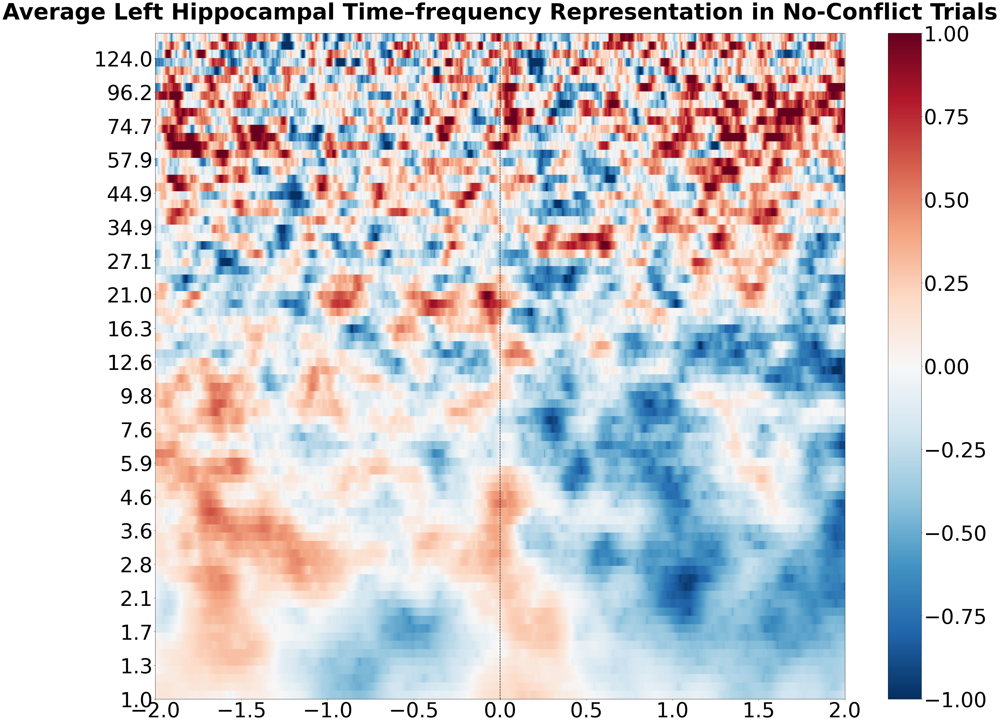

In [8]:
plot_allsub_averages(all_subs_average_hc_noconflict, "Average Left Hippocampal Time–frequency Representation in No-Conflict Trials", 'average_Lhc_noconflict_all_subs.png', -2, 2)

### Right Hippocampus

In [9]:
all_subs_average_hcs = calculate_last_away_average(Rhc_sub_list, conditions, 'hc', 'Rhc')
all_subs_average_hc_conflict = all_subs_average_hcs[0]
all_subs_average_hc_noconflict = all_subs_average_hcs[1]


Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/hc-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/hc-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/SLCH002/ieeg/last_away/hc-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH025', 'BJH016', 'SLCH002']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH027/ieeg/last_away/hc-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

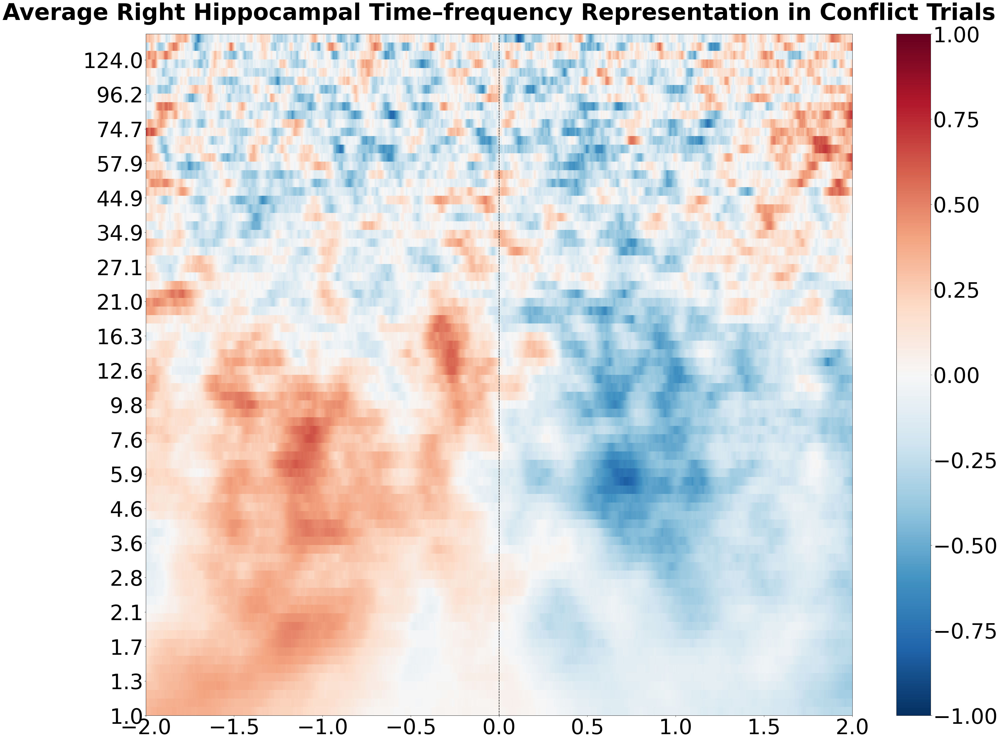

In [10]:
plot_allsub_averages(all_subs_average_hc_conflict, "Average Right Hippocampal Time–frequency Representation in Conflict Trials", 'average_Rhc_conflict_all_subs.png', -2, 2)

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

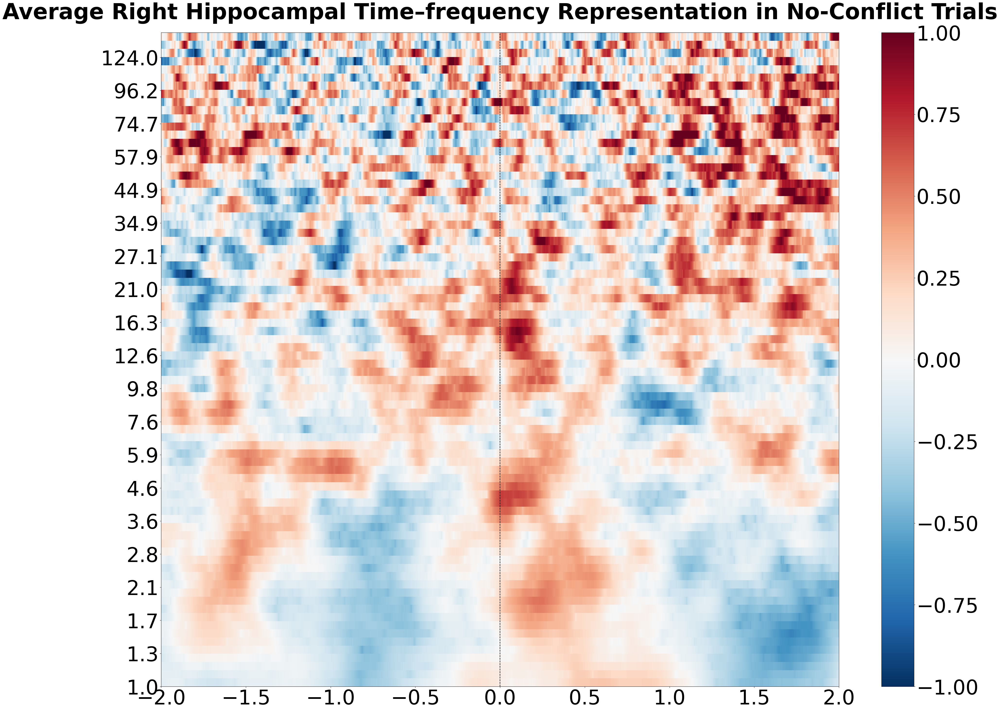

In [11]:
plot_allsub_averages(all_subs_average_hc_noconflict, "Average Right Hippocampal Time–frequency Representation in No-Conflict Trials", 'average_Rhc_noconflict_all_subs.png', -2, 2)

## OFC

In [ ]:
all_subs_average_ofcs = calculate_last_away_average(sub_list, conditions, 'ofc')
all_subs_average_ofc_escape = all_subs_average_ofcs[0]
all_subs_average_ofc_chase = all_subs_average_ofcs[1]


In [ ]:
plot_allsub_averages(all_subs_average_ofc_escape, "Average OFC Time–frequency Representation in Conflict Trials", 'average_ofc_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_ofc_chase, "Average OFC Time–frequency Representation in No-Conflict Trials", 'average_ofc_noconflict_all_subs.png', -2, 2)

## Anterior Cingulate

In [ ]:
all_subs_average_cings = calculate_last_away_average(sub_list, conditions, 'cing')
all_subs_average_cing_escape = all_subs_average_cings[0]
all_subs_average_cing_chase = all_subs_average_cings[1]


In [ ]:
plot_allsub_averages(all_subs_average_cing_escape, "Average Ant. Cingulate Time–frequency Representation in Conflict Trials", 'average_cing_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_cing_chase, "Average Ant. Cingulate Time–frequency Representation in No-Conflict Trials", 'average_cing_noconflict_all_subs.png', -2, 2)

## Amygdala

In [ ]:
all_subs_average_amygs = calculate_last_away_average(sub_list, conditions, 'amyg')
all_subs_average_amyg_escape = all_subs_average_amygs[0]
all_subs_average_amyg_chase = all_subs_average_amygs[1]


In [ ]:
plot_allsub_averages(all_subs_average_amyg_escape, "Average Amygdala Time–frequency Representation in Conflict Trials", 'average_amyg_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_amyg_chase, "Average Amygdala Time–frequency Representation in No-Conflict Trials", 'average_amyg_noconflict_all_subs.png', -2, 2)

### Left Amygdala

In [6]:
all_subs_average_amygs = calculate_last_away_average(Lamyg_sub_list, conditions, 'amyg', 'Lamyg')
all_subs_average_amyg_escape = all_subs_average_amygs[0]
all_subs_average_amyg_chase = all_subs_average_amygs[1]

Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021', 'BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021', 'BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH026/ieeg/last_away/amyg-tfr.h5 ...
Replacing existing metadata with 5 columns
log transforming
z-scoring to baseline
NOTE: pick_channels() is a lega

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

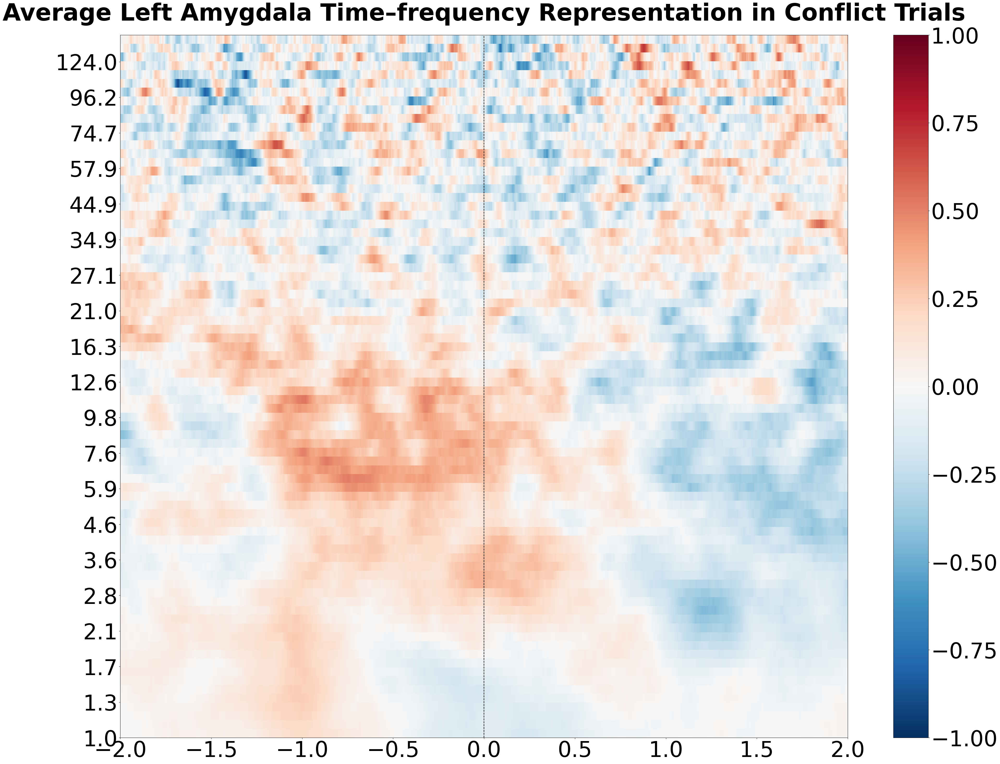

In [7]:
plot_allsub_averages(all_subs_average_amyg_escape, "Average Left Amygdala Time–frequency Representation in Conflict Trials", 'average_Lamyg_conflict_all_subs.png', -2, 2)

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

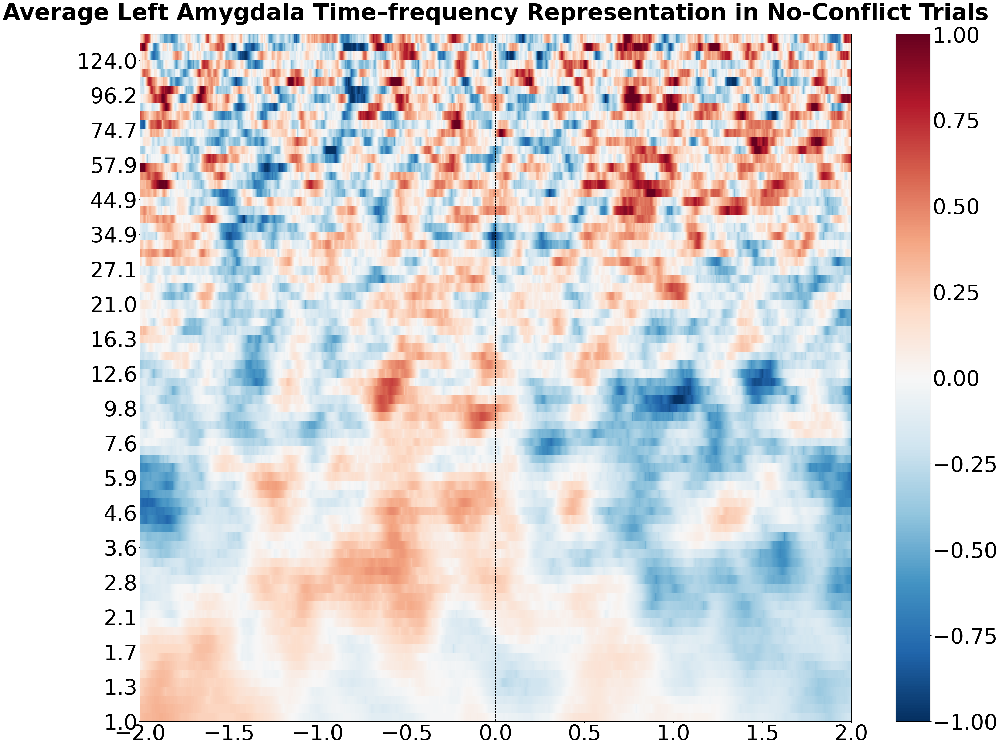

In [8]:
plot_allsub_averages(all_subs_average_amyg_chase, "Average Left Amygdala Time–frequency Representation in No-Conflict Trials", 'average_Lamyg_noconflict_all_subs.png', -2, 2)

### Right Amygdala

In [9]:
all_subs_average_amygs = calculate_last_away_average(Ramyg_sub_list, conditions, 'amyg', 'Ramyg')
all_subs_average_amyg_escape = all_subs_average_amygs[0]
all_subs_average_amyg_chase = all_subs_average_amygs[1]

Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021', 'BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/amyg-tfr.h5 ...
log transforming
z-scoring to baseline
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
currently used subs: ['BJH021', 'BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH026/ieeg/last_away/amyg-tfr.h5 ...
Replacing existing metadata with 5 columns
log transforming
z-scoring to baseline
NOTE: pick_channels() is a lega

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

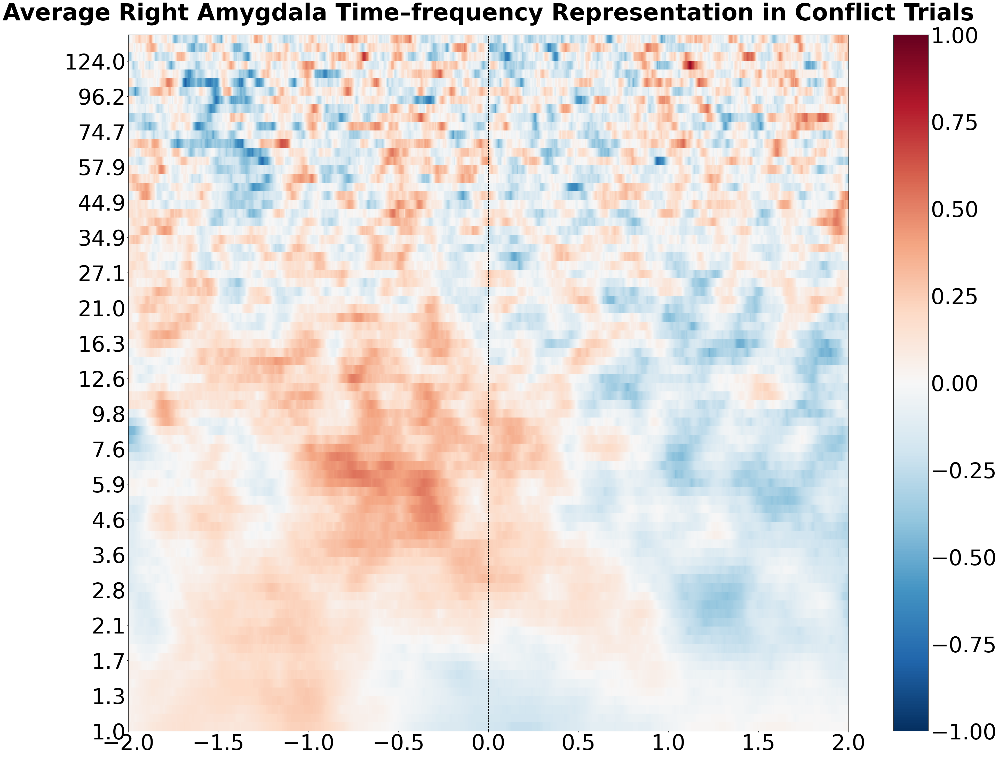

In [10]:
plot_allsub_averages(all_subs_average_amyg_escape, "Average Right Amygdala Time–frequency Representation in Conflict Trials", 'average_Ramyg_conflict_all_subs.png', -2, 2)

findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: Generic family 'serif' not found because none of the following families were found: Times New Roman
findfont: 

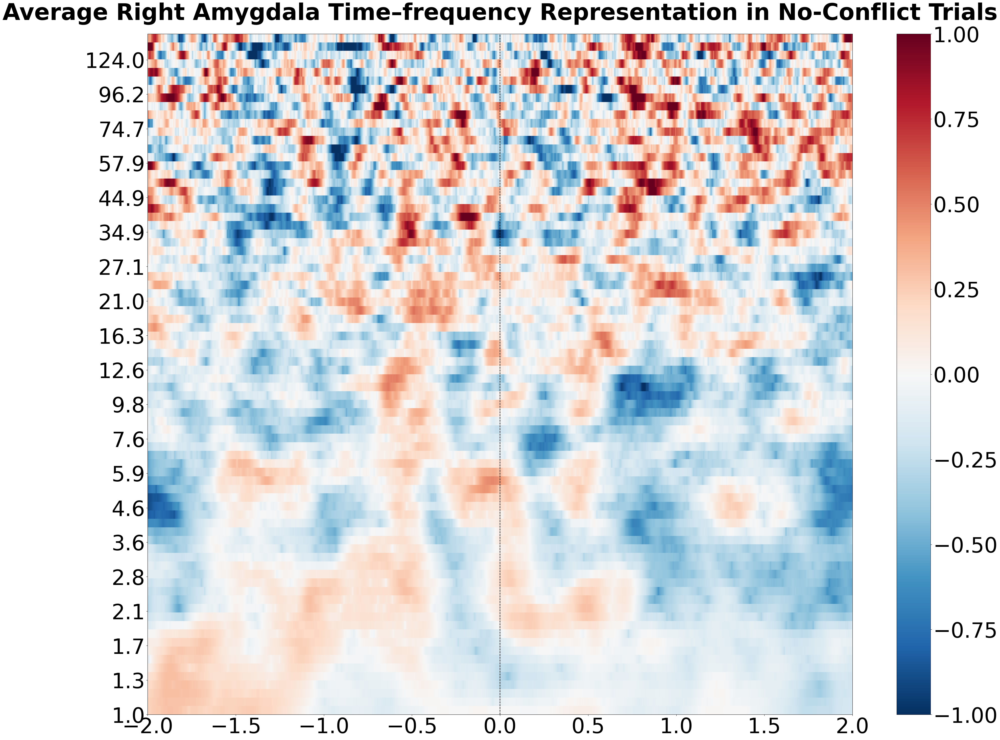

In [11]:
plot_allsub_averages(all_subs_average_amyg_chase, "Average Right Amygdala Time–frequency Representation in No-Conflict Trials", 'average_Ramyg_noconflict_all_subs.png', -2, 2)

# Other Regions

## dlPFC

### Medial Frontal Gyrus

In [22]:
all_subs_average_dlpfcs = calculate_last_away_average(mfg_sub_list, conditions, 'dlpfc', 'mfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]



Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/dlpfc-tfr.h5 ...


Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/SLCH002/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 'SLCH002']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH026/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 

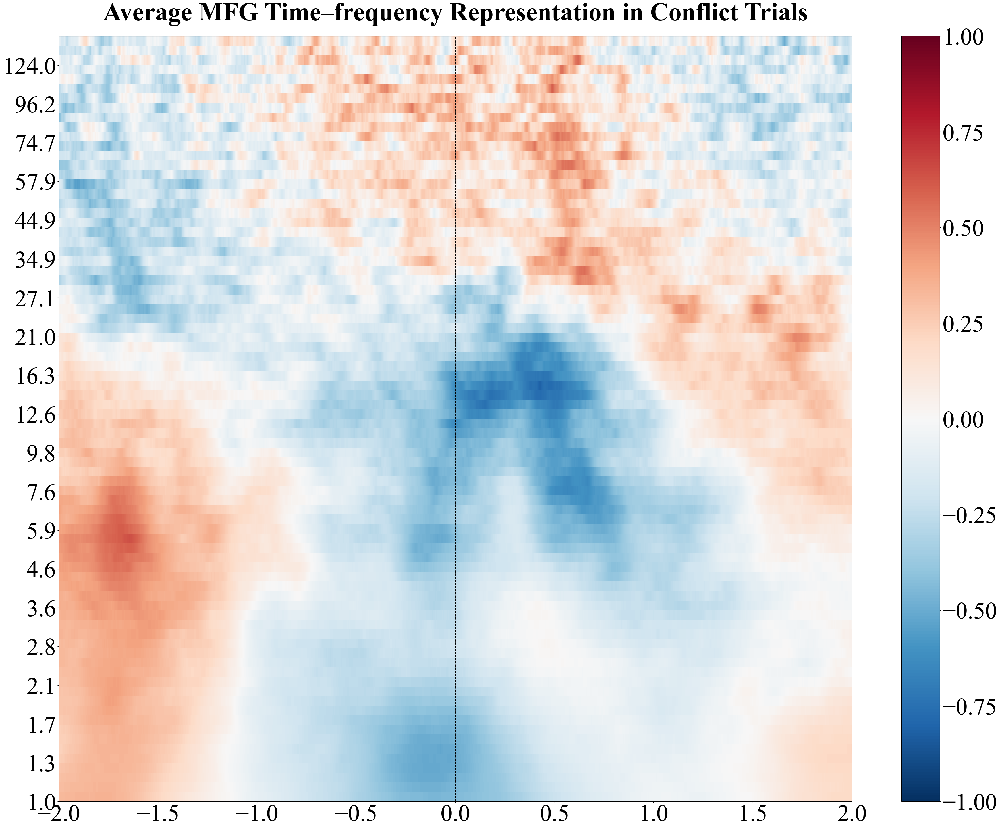

In [7]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average MFG Time–frequency Representation in Conflict Trials", 'average_dlpfc_conflict_all_subs.png', -2, 2)

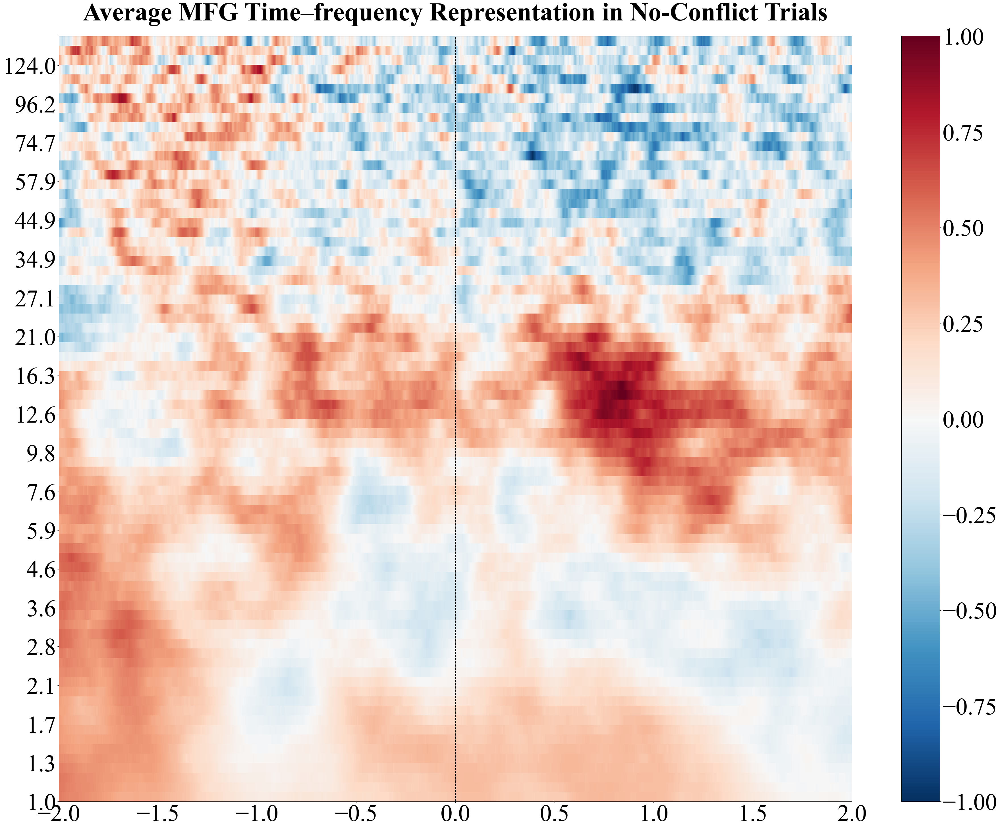

In [8]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average MFG Time–frequency Representation in No-Conflict Trials", 'average_dlpfc_noconflict_all_subs.png', -2, 2)

### Anterior Medial Frontal Gyrus

In [7]:
all_subs_average_dlpfcs = calculate_last_away_average(mfg_sub_list, conditions, 'dlpfc', 'Amfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]


Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/dlpfc-tfr.h5 ...


Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/SLCH002/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 'SLCH002']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH026/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 

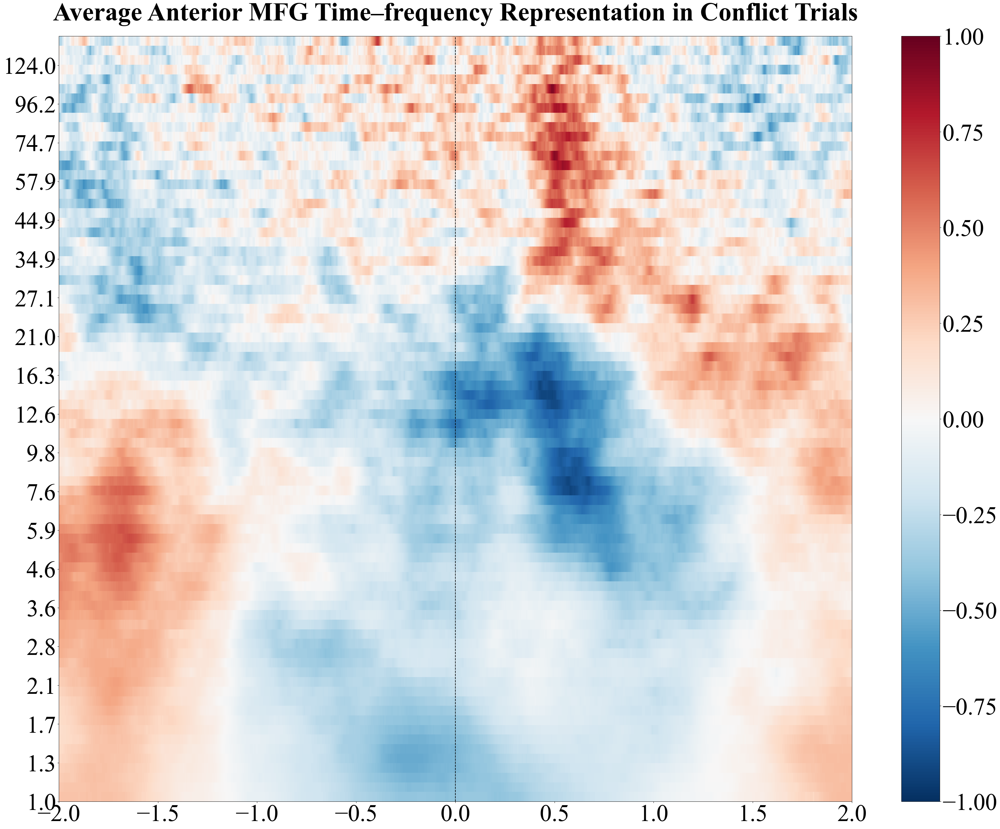

In [8]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average Anterior MFG Time–frequency Representation in Conflict Trials", 'average_anterior_mfg_conflict_all_subs.png', -2, 2)

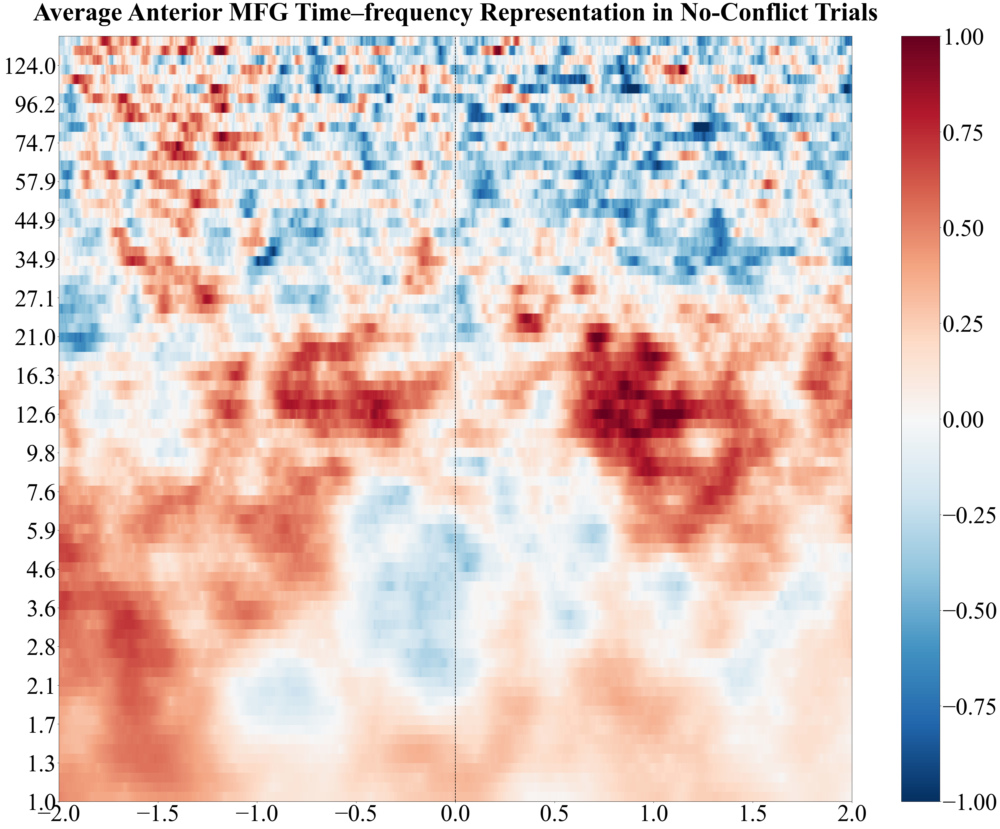

In [9]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average Anterior MFG Time–frequency Representation in No-Conflict Trials", 'average_anterior_mfg_noconflict_all_subs.png', -2, 2)

### Posterior Medial Frontal Gyrus

In [10]:
all_subs_average_dlpfcs = calculate_last_away_average(mfg_sub_list, conditions, 'dlpfc', 'Pmfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]

Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH021/ieeg/last_away/dlpfc-tfr.h5 ...


Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH016/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/SLCH002/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 'SLCH002']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH026/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH021', 'BJH025', 'BJH016', 

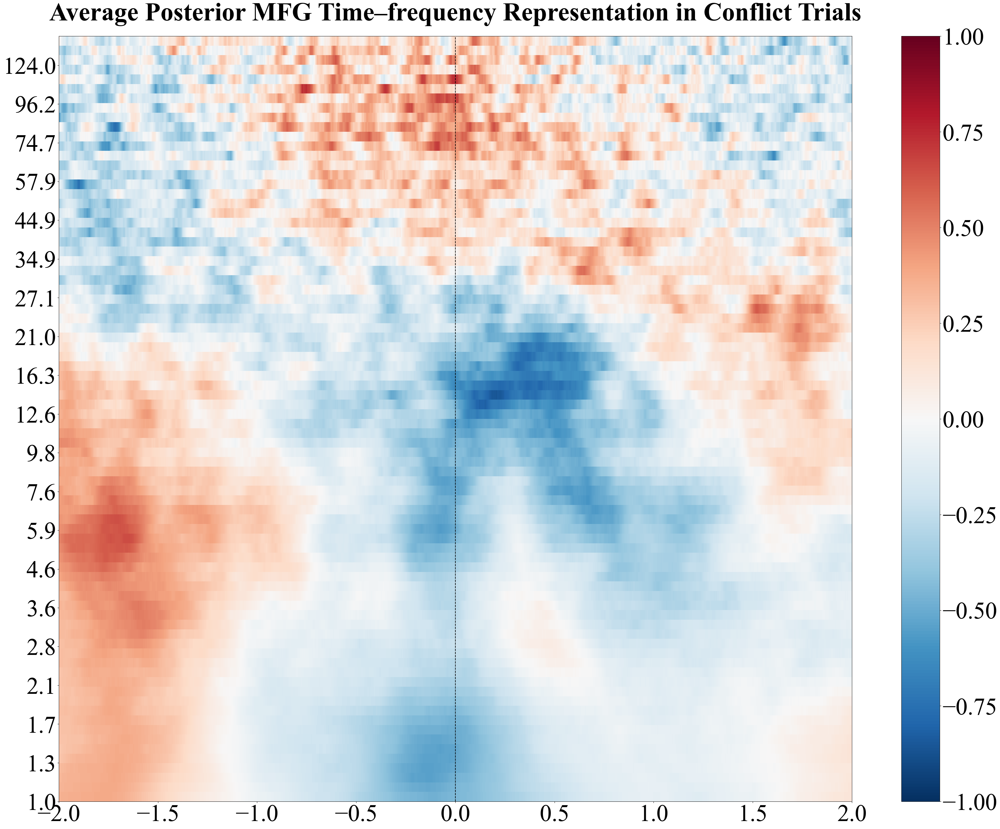

In [11]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average Posterior MFG Time–frequency Representation in Conflict Trials", 'average_posterior_mfg_conflict_all_subs.png', -2, 2)

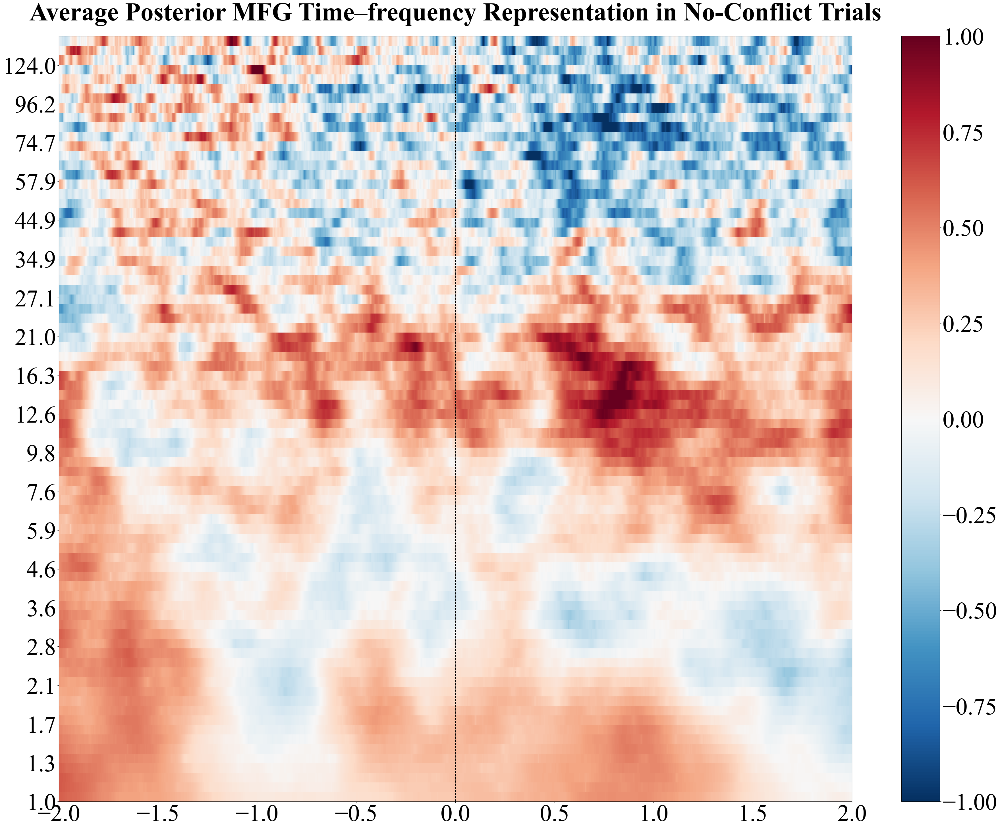

In [12]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average Posterior MFG Time–frequency Representation in No-Conflict Trials", 'average_posterior_mfg_noconflict_all_subs.png', -2, 2)

### Superior Frontal Gyrus

In [13]:
all_subs_average_dlpfcs = calculate_last_away_average(sfg_sub_list, conditions, 'dlpfc', 'sfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]


Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL12/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL13/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL14/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13', 'LL14']


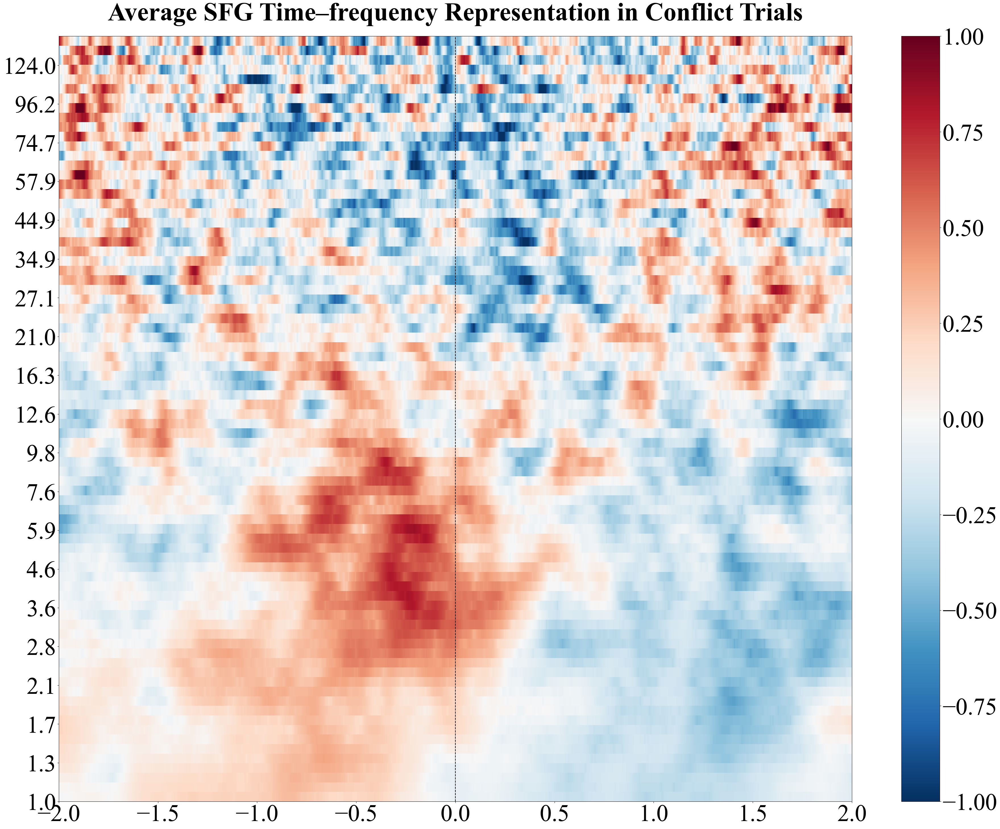

In [14]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average SFG Time–frequency Representation in Conflict Trials", 'average_SFG_conflict_all_subs.png', -2, 2)

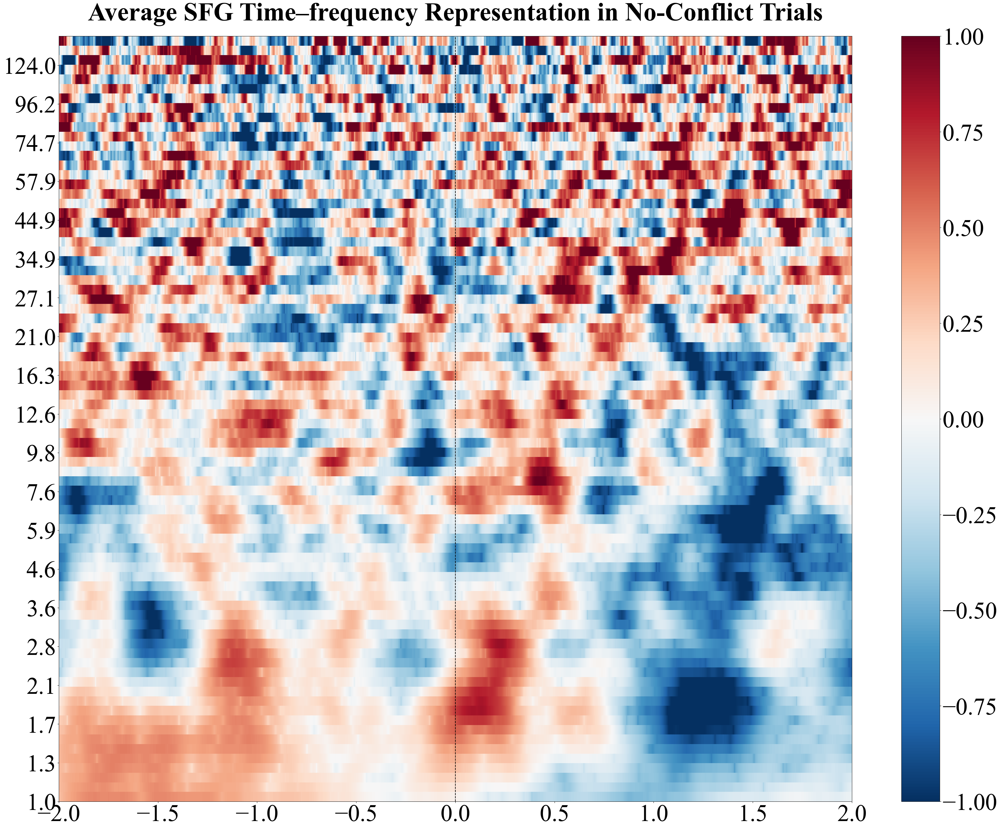

In [15]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average SFG Time–frequency Representation in No-Conflict Trials", 'average_SFG_noconflict_all_subs.png', -2, 2)

### Anterior Superior Frontal Gyrus

In [16]:
all_subs_average_dlpfcs = calculate_last_away_average(sfg_sub_list, conditions, 'dlpfc', 'Asfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]

Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...


Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL12/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL13/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL14/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13', 'LL14']


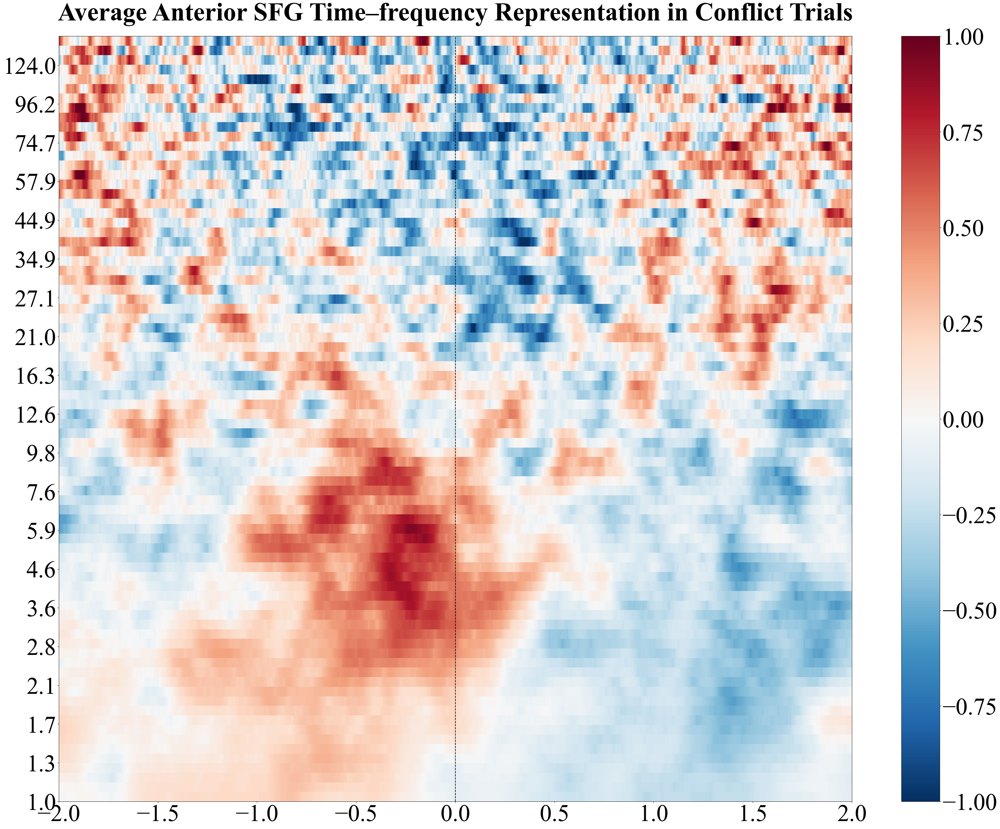

In [17]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average Anterior SFG Time–frequency Representation in Conflict Trials", 'average_anterior_sfg_conflict_all_subs.png', -2, 2)

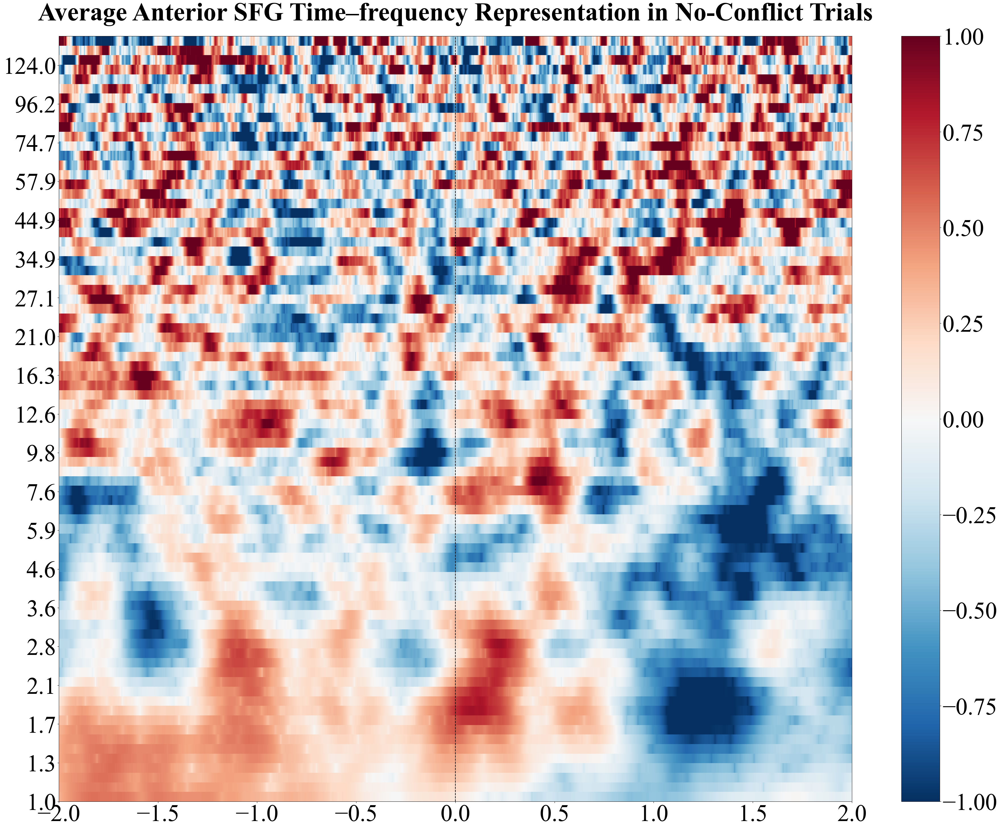

In [18]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average Anterior SFG Time–frequency Representation in No-Conflict Trials", 'average_anterior_sfg_noconflict_all_subs.png', -2, 2)

### Posterior Superior Frontal Gyrus

In [19]:
all_subs_average_dlpfcs = calculate_last_away_average(sfg_sub_list, conditions, 'dlpfc', 'Psfg')
all_subs_average_dlpfc_escape = all_subs_average_dlpfcs[0]
all_subs_average_dlpfc_chase = all_subs_average_dlpfcs[1]

Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/BJH025/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL12/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL13/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13']
Reading /mnt/knight_server/remote/bstavel/pacman/preprocessing/LL14/ieeg/last_away/dlpfc-tfr.h5 ...
Adding metadata with 5 columns
log transforming
z-scoring to baseline
currently used subs: ['BJH025', 'LL12', 'LL13', 'LL14']


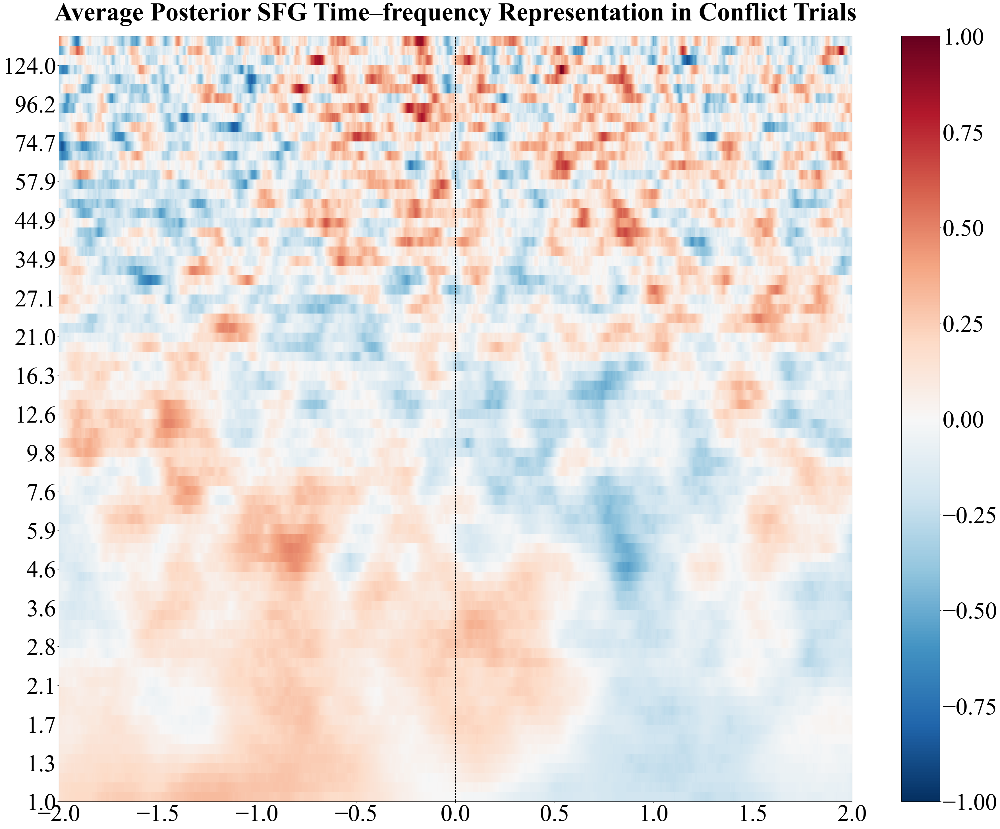

In [20]:
plot_allsub_averages(all_subs_average_dlpfc_escape, "Average Posterior SFG Time–frequency Representation in Conflict Trials", 'average_posterior_sfg_conflict_all_subs.png', -2, 2)

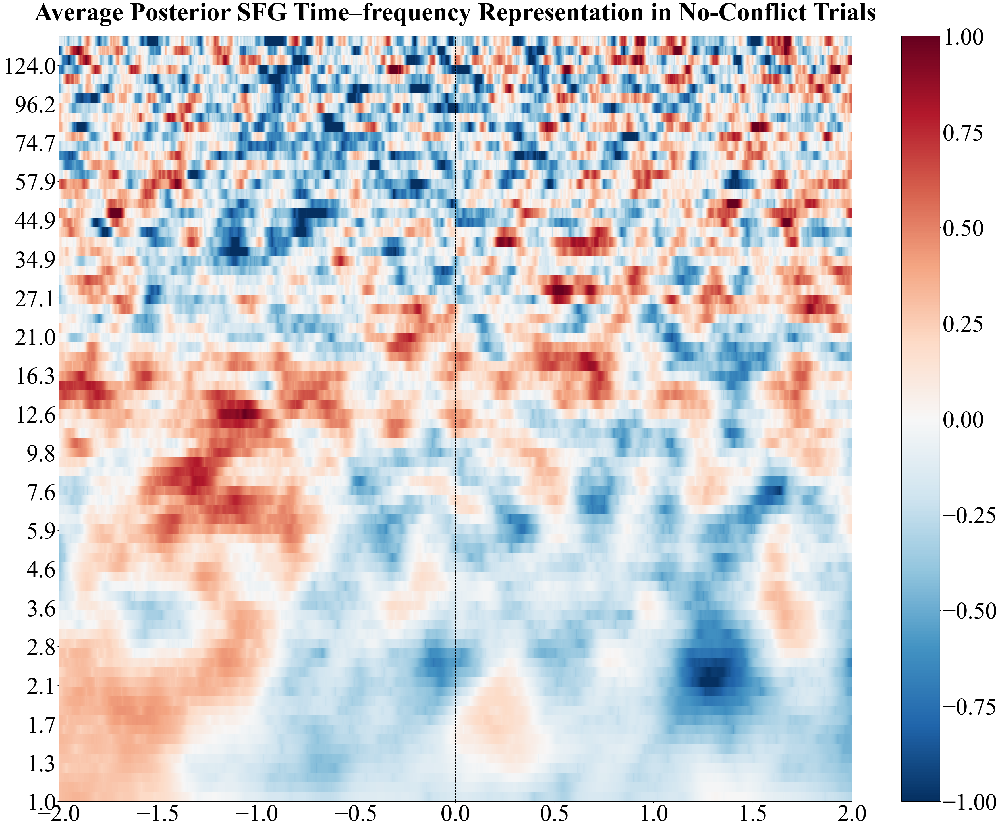

In [21]:
plot_allsub_averages(all_subs_average_dlpfc_chase, "Average Posterior SFG Time–frequency Representation in No-Conflict Trials", 'average_posterior_sfg_noconflict_all_subs.png', -2, 2)

## Insula

In [ ]:
all_subs_average_insulas = calculate_last_away_average(sub_list, conditions, 'insula')
all_subs_average_insula_escape = all_subs_average_insulas[0]
all_subs_average_insula_chase = all_subs_average_insulas[1]


In [ ]:
plot_allsub_averages(all_subs_average_insula_escape, "Average Insula Time–frequency Representation in Conflict Trials", 'average_insula_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_insula_chase, "Average Insula Time–frequency Representation in No-Conflict Trials", 'average_insula_noconflict_all_subs.png', -2, 2)

## EC

In [ ]:
all_subs_average_ecs = calculate_last_away_average(sub_list, conditions, 'ec')
all_subs_average_ec_escape = all_subs_average_ecs[0]
all_subs_average_ec_chase = all_subs_average_ecs[1]


In [ ]:
plot_allsub_averages(all_subs_average_ec_escape, "Average Entorhinal Cortex Time–frequency Representation in Conflict Trials", 'average_ec_conflict_all_subs.png', -2, 2)

In [ ]:
plot_allsub_averages(all_subs_average_ec_chase, "Average Entorhinal Cortex Time–frequency Representation in No-Conflict Trials", 'average_ec_noconflict_all_subs.png', -2, 2)